## Team 14 - Melbourne

##### Kranthi Kumar Kommuri 1049507
##### James Ng 1316315
##### Emmanuel Pinca 1080088
##### Matteo Rossi 1222468
##### Thanadol Ultarnpatumros 1323866

In [2]:
#https://gist.github.com/marians/8e41fc817f04de7c4a70

import couchdb
import folium
from folium import Choropleth
from folium.plugins import HeatMap, MarkerCluster
import random
import geopandas as gpd
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, Point

### Get SHP Map

In [35]:
suburbs = gpd.read_file('./localities/vic.shp')
suburbs = suburbs.drop(columns=['LC_PLY_PID', 'LOC_PID', "DT_CREATE", "LOC_CLASS", "STATE"])

In [36]:
suburbs = suburbs[["LOC_NAME", "geometry"]].set_index("LOC_NAME")

In [37]:
suburbs

,geometry
LOC_NAME,
Abbeyard,"POLYGON ((146.81721 -37.09735, 146.81729 -37.0..."
Abbotsford,"POLYGON ((145.00235 -37.80723, 145.00350 -37.8..."
Aberfeldie,"POLYGON ((144.89830 -37.76465, 144.89790 -37.7..."
Aberfeldy,"POLYGON ((146.39447 -37.71008, 146.39405 -37.7..."
Acheron,"POLYGON ((145.75030 -37.24313, 145.75036 -37.2..."
...,...
Yundool,"POLYGON ((145.85808 -36.26996, 145.85813 -36.2..."
Yuroke,"POLYGON ((144.87770 -37.58472, 144.87867 -37.5..."
Yuulong,"POLYGON ((143.29976 -38.75116, 143.29895 -38.7..."


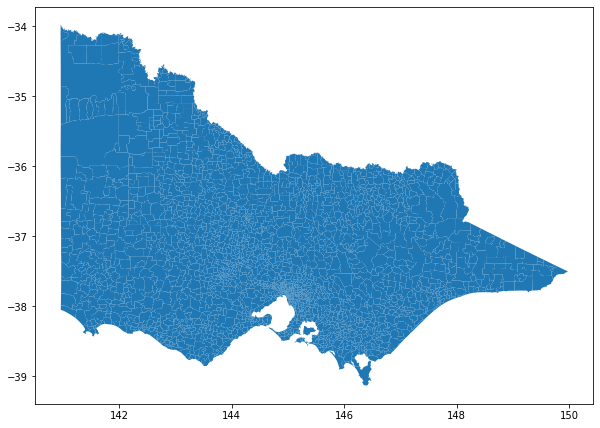

In [38]:
suburbs.plot(figsize=(10, 10))
plt.show()

In [39]:
suburbsToKeep = pd.read_csv("suburbs.txt", header=None)

In [40]:
suburbs = suburbs.loc[suburbsToKeep[0]]

In [41]:
suburbs

,geometry
LOC_NAME,
Melbourne,"POLYGON ((144.97797 -37.83867, 144.97803 -37.8..."
Southbank,"POLYGON ((144.95308 -37.82740, 144.95328 -37.8..."
St Kilda,"POLYGON ((144.99038 -37.87073, 144.99036 -37.8..."
Docklands,"POLYGON ((144.95376 -37.82363, 144.95336 -37.8..."
Richmond,"POLYGON ((145.00407 -37.83137, 145.00396 -37.8..."
...,...
Sandringham,"POLYGON ((145.00670 -37.95693, 145.00655 -37.9..."
Upper Ferntree Gully,"POLYGON ((145.32416 -37.89994, 145.32414 -37.9..."
Yarra Glen,"POLYGON ((145.36232 -37.67205, 145.36236 -37.6..."


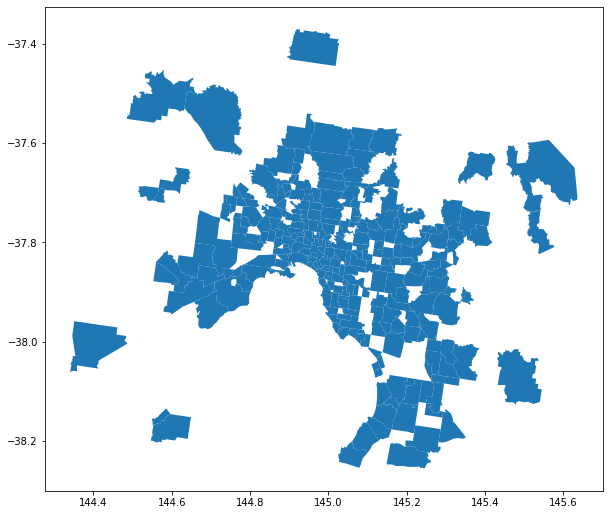

In [42]:
suburbs.plot(figsize=(10, 10))
plt.show()

### Get Tweets && Find Poligon To Which They Belong

In [52]:
user = "admin"
password = "admin"
couchserver = couchdb.Server("http://%s:%s@172.26.134.187:5984/" % (user, password))
db = couchserver['twitter']
rows = db.view('_design/CrimeInfo/_view/GeoData')
points = [row['value'] for row in rows]

In [44]:
points = pd.DataFrame(points)

In [45]:
points[0] = points[0].apply(float)
points[1] = points[1].apply(float)
points['coords'] = list(zip(points[1],points[0]))
points['coords'] = points['coords'].apply(Point)

In [46]:
points = gpd.GeoDataFrame(points, geometry='coords', crs=suburbs.crs)

In [47]:
points

,0,1,coords
0,-37.820985,144.962631,POINT (144.96263 -37.82098)
1,-37.847222,144.966944,POINT (144.96694 -37.84722)
2,-37.815600,144.966100,POINT (144.96610 -37.81560)
3,-37.815600,144.966100,POINT (144.96610 -37.81560)
4,-37.815600,144.966100,POINT (144.96610 -37.81560)
...,...,...,...
322458,-37.904665,144.673080,POINT (144.67308 -37.90466)
322459,-37.956925,145.217338,POINT (145.21734 -37.95692)
322460,-37.774762,144.943430,POINT (144.94343 -37.77476)
322461,-37.827603,144.993674,POINT (144.99367 -37.82760)


In [19]:
pointInPolys = gpd.sjoin(points, suburbs)

In [20]:
pointInPolys

,0,1,coords,index_right
0,-37.820985,144.962631,POINT (144.96263 -37.82098),Southbank
21,-37.824060,144.967610,POINT (144.96761 -37.82406),Southbank
73,-37.827073,144.966485,POINT (144.96649 -37.82707),Southbank
122,-37.824260,144.963263,POINT (144.96326 -37.82426),Southbank
130,-37.824121,144.958836,POINT (144.95884 -37.82412),Southbank
...,...,...,...,...
301709,-37.711193,144.779495,POINT (144.77950 -37.71119),Delahey
310764,-37.723299,144.771180,POINT (144.77118 -37.72330),Delahey
313360,-37.723576,144.771181,POINT (144.77118 -37.72358),Delahey
315473,-37.724047,144.776094,POINT (144.77609 -37.72405),Delahey


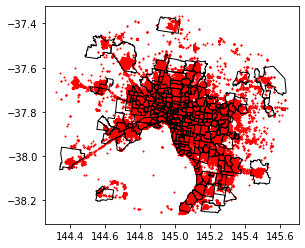

In [21]:
# Plot map with points in red
base = suburbs.boundary.plot(linewidth=1, edgecolor="black")
points.plot(ax=base, linewidth=1, color="red", markersize=1)
plt.show()

In [22]:
counts = pointInPolys['index_right'].value_counts()

### Choropleth Map

In [23]:
# Create a base map
m = folium.Map(location=[-37.810612, 144.963954], tiles='cartodbpositron', zoom_start=12)

# Add a choropleth map to the base map
Choropleth(geo_data=suburbs.__geo_interface__, 
           data=counts, 
           key_on="feature.id", 
           fill_color='YlGnBu', 
           threshold_scale = [0,100,500,1000,2500,15000],
           legend_name='Number Of Tweets Per Suburb'
          ).add_to(m)

# Display the map
m

ValueError: All values are expected to fall into one of the provided bins (or to be Nan). Please check the `bins` parameter and/or your data.

### Heat Map

In [24]:
coords = [row['value'] for row in rows]
coords = coords[:1500]

In [25]:
# Create a base map
m2 = folium.Map(location=[-37.810612, 144.963954], tiles='cartodbpositron', zoom_start=12)

# Add a choropleth map to the base map
HeatMap(coords).add_to(m2)

# Display the map
m2

In [26]:
mCluster = MarkerCluster(name="Markers").add_to(m2)

for each in coords:
    folium.Marker(location=[each[0], each[1]], 
                 popup="Latitude: {0}, Longitude: {1}".format(each[0], each[1])).add_to(mCluster)

folium.LayerControl().add_to(m2)

m2

In [153]:
counts = pd.read_pickle("./counts.pkl")
counts

Melbourne               79
Southbank               83
St Kilda                69
Docklands               76
Richmond                74
                        ..
Sandringham             88
Rosanna                 58
Yarra Glen              84
Upper Ferntree Gully    50
Burnside Heights        72
Name: index_right, Length: 253, dtype: int64

In [123]:
suburbs = pd.read_pickle("./suburbs.pkl")
suburbs

,geometry
LOC_NAME,
Melbourne,"POLYGON ((144.97797 -37.83867, 144.97803 -37.8..."
Southbank,"POLYGON ((144.95308 -37.82740, 144.95328 -37.8..."
St Kilda,"POLYGON ((144.99038 -37.87073, 144.99036 -37.8..."
Docklands,"POLYGON ((144.95376 -37.82363, 144.95336 -37.8..."
Richmond,"POLYGON ((145.00407 -37.83137, 145.00396 -37.8..."
...,...
Sandringham,"POLYGON ((145.00670 -37.95693, 145.00655 -37.9..."
Upper Ferntree Gully,"POLYGON ((145.32416 -37.89994, 145.32414 -37.9..."
Yarra Glen,"POLYGON ((145.36232 -37.67205, 145.36236 -37.6..."


In [4]:
suburbData = pd.read_pickle("./suburbData.pkl")
type(suburbData)

geopandas.geodataframe.GeoDataFrame

In [99]:
for item in db.view('_design/Data/_view/Date', reduce=False):
    print(item.key, item.id, item.value)

['Abbotsford', 1406599328000] 493939499622080512 1
['Abbotsford', 1406607251000] 493972731012984833 0
['Abbotsford', 1406612677000] 493995489251971074 0
['Abbotsford', 1406700104000] 494362185645428736 1
['Abbotsford', 1406705759000] 494385903193047040 1
['Abbotsford', 1406713248000] 494417317011652608 1
['Abbotsford', 1406715194000] 494425476065017857 0
['Abbotsford', 1406715257000] 494425741363118080 1
['Abbotsford', 1406726273000] 494471945816006657 0
['Abbotsford', 1406731111000] 494492237967802369 1
['Abbotsford', 1406844097000] 494966135909912576 1
['Abbotsford', 1406879974000] 495116614602223616 1
['Abbotsford', 1406959843000] 495451610793791488 1
['Abbotsford', 1407030025000] 495745974740848640 1
['Abbotsford', 1407034967000] 495766702492106752 1
['Abbotsford', 1407061893000] 495879638426476544 1
['Abbotsford', 1407109015000] 496077284546076672 1
['Abbotsford', 1407119721000] 496122185795108864 0
['Abbotsford', 1407126857000] 496152119200583680 0
['Abbotsford', 1407132107000] 4

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [110]:
pos = 0
neg = 0
for item in db.view('_design/Data/_view/Date', reduce=False):
    if (item.key[0] == "Abbotsford" and item.value == 1):
        pos += 1
    if (item.key[0] == "Abbotsford" and item.value == 0):
        neg += 1
    ## print(item.key, item.id, item.value)
print(pos)
print(neg)

456
234


In [101]:
for item in db.view('_design/Data/_view/Date', group=True):
    print(item.key, item.value)

['Abbotsford', 1406599328000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406607251000] {'sum': 0, 'count': 1, 'min': 0, 'max': 0, 'sumsqr': 0}
['Abbotsford', 1406612677000] {'sum': 0, 'count': 1, 'min': 0, 'max': 0, 'sumsqr': 0}
['Abbotsford', 1406700104000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406705759000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406713248000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406715194000] {'sum': 0, 'count': 1, 'min': 0, 'max': 0, 'sumsqr': 0}
['Abbotsford', 1406715257000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406726273000] {'sum': 0, 'count': 1, 'min': 0, 'max': 0, 'sumsqr': 0}
['Abbotsford', 1406731111000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406844097000] {'sum': 1, 'count': 1, 'min': 1, 'max': 1, 'sumsqr': 1}
['Abbotsford', 1406879974000] {'sum': 1, 'count': 1, '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [102]:
for item in db.view('_design/Data/_view/Date', group=True, group_level=1):
    print(item.key, item.value)

['Abbotsford'] {'sum': 456, 'count': 690, 'min': 0, 'max': 1, 'sumsqr': 456}
['Aberfeldie'] {'sum': 50, 'count': 70, 'min': 0, 'max': 1, 'sumsqr': 50}
['Aintree'] {'sum': 1, 'count': 3, 'min': 0, 'max': 1, 'sumsqr': 1}
['Airport West'] {'sum': 83, 'count': 139, 'min': 0, 'max': 1, 'sumsqr': 83}
['Albanvale'] {'sum': 77, 'count': 107, 'min': 0, 'max': 1, 'sumsqr': 77}
['Albert Park'] {'sum': 265, 'count': 343, 'min': 0, 'max': 1, 'sumsqr': 265}
['Albion'] {'sum': 33, 'count': 64, 'min': 0, 'max': 1, 'sumsqr': 33}
['Alphington'] {'sum': 76, 'count': 110, 'min': 0, 'max': 1, 'sumsqr': 76}
['Altona'] {'sum': 262, 'count': 433, 'min': 0, 'max': 1, 'sumsqr': 262}
['Altona Meadows'] {'sum': 115, 'count': 196, 'min': 0, 'max': 1, 'sumsqr': 115}
['Altona North'] {'sum': 176, 'count': 371, 'min': 0, 'max': 1, 'sumsqr': 176}
['Ardeer'] {'sum': 27, 'count': 34, 'min': 0, 'max': 1, 'sumsqr': 27}
['Armadale'] {'sum': 224, 'count': 420, 'min': 0, 'max': 1, 'sumsqr': 224}
['Ascot Vale'] {'sum': 245, '

In [151]:
start = 0
end = 9999999999999999

for suburb in suburbs['geometry'].index.tolist():
    for item in db.view('_design/Data/_view/Date', reduce=False, startkey=[suburb, start], endkey=[suburb, end]):
        print(item.key, item.id, item.value)

['Melbourne', 1406591980000] 493908682439000064 1
['Melbourne', 1406593546000] 493915248974639104 1
['Melbourne', 1406593779000] 493916226402275330 0
['Melbourne', 1406593900000] 493916732596047872 0
['Melbourne', 1406595408000] 493923058130759682 1
['Melbourne', 1406596123000] 493926058920386561 1
['Melbourne', 1406599310000] 493939424506290177 0
['Melbourne', 1406599774000] 493941371942608896 1
['Melbourne', 1406600445000] 493944183980167169 0
['Melbourne', 1406600609000] 493944874215813120 1
['Melbourne', 1406602602000] 493953231492374528 1
['Melbourne', 1406603246000] 493955932305379328 1
['Melbourne', 1406604271000] 493960233535156224 0
['Melbourne', 1406606221000] 493968409877438467 1
['Melbourne', 1406606910000] 493971301636128769 0
['Melbourne', 1406607023000] 493971774716248065 0
['Melbourne', 1406608606000] 493978413246320640 0
['Melbourne', 1406608767000] 493979091389804544 1
['Melbourne', 1406608910000] 493979690613239809 1
['Melbourne', 1406609141000] 493980657916203008 1


['St Kilda', 1406599497000] 493940209134731265 1
['St Kilda', 1406600916000] 493946158981472256 1
['St Kilda', 1406627562000] 494057923291934720 0
['St Kilda', 1406628331000] 494061145783693312 0
['St Kilda', 1406629721000] 494066978642874368 1
['St Kilda', 1406634237000] 494085919301828608 1
['St Kilda', 1406634898000] 494088691585777664 0
['St Kilda', 1406638569000] 494104087709773826 0
['St Kilda', 1406641627000] 494116914801557504 0
['St Kilda', 1406644685000] 494129740341469188 0
['St Kilda', 1406675716000] 494259895948947456 0
['St Kilda', 1406676768000] 494264307727605760 0
['St Kilda', 1406681510000] 494284195368542208 1
['St Kilda', 1406690435000] 494321631657877504 1
['St Kilda', 1406700905000] 494365545911693312 1
['St Kilda', 1406705865000] 494386347948265472 1
['St Kilda', 1406706583000] 494389359064272896 0
['St Kilda', 1406711879000] 494411575051046913 0
['St Kilda', 1406713942000] 494420225169702914 0
['St Kilda', 1406716617000] 494431444249239552 0
['St Kilda', 1406718

['South Yarra', 1406595341000] 493922777104015360 1
['South Yarra', 1406600617000] 493944906310623232 1
['South Yarra', 1406601807000] 493949896635199488 0
['South Yarra', 1406604634000] 493961756650528768 1
['South Yarra', 1406606953000] 493971481420771332 1
['South Yarra', 1406612081000] 493992989585182721 1
['South Yarra', 1406612341000] 493994079907094529 1
['South Yarra', 1406613381000] 493998441635119105 1
['South Yarra', 1406614034000] 494001180087816196 1
['South Yarra', 1406615888000] 494008958500089856 1
['South Yarra', 1406616046000] 494009622387101696 0
['South Yarra', 1406619557000] 494024346499690496 0
['South Yarra', 1406619637000] 494024682878676992 1
['South Yarra', 1406638168000] 494102405525417987 1
['South Yarra', 1406639940000] 494109839996383233 1
['South Yarra', 1406671041000] 494240284868218880 1
['South Yarra', 1406678569000] 494271861291626497 1
['South Yarra', 1406683003000] 494290459624083456 0
['South Yarra', 1406685065000] 494299108316684289 1
['South Yarr

['Melbourne Airport', 1406592059000] 493909010056097792 1
['Melbourne Airport', 1406594217000] 493918062127489024 1
['Melbourne Airport', 1406603141000] 493955491463057409 1
['Melbourne Airport', 1406603920000] 493958761435107328 1
['Melbourne Airport', 1406617391000] 494015262296125441 0
['Melbourne Airport', 1406626295000] 494052609360027649 1
['Melbourne Airport', 1406635515000] 494091281639804928 0
['Melbourne Airport', 1406677917000] 494269124432781314 1
['Melbourne Airport', 1406681032000] 494282192395440128 1
['Melbourne Airport', 1406682578000] 494288676726112258 1
['Melbourne Airport', 1406683708000] 494293413760487424 1
['Melbourne Airport', 1406684666000] 494297432293785601 1
['Melbourne Airport', 1406704779000] 494381792103649280 1
['Melbourne Airport', 1406707308000] 494392401113255936 1
['Melbourne Airport', 1406710983000] 494407814144483329 0
['Melbourne Airport', 1406714592000] 494422951672815618 0
['Melbourne Airport', 1406715331000] 494426050340745217 1
['Melbourne Ai

['Sandhurst', 1406633573000] 494083135286411264 1
['Sandhurst', 1406803993000] 494797928028860416 1
['Sandhurst', 1407029281000] 495742855793500160 1
['Sandhurst', 1407308329000] 496913266489040896 1
['Sandhurst', 1408848591000] 503373592529096706 1
['Sandhurst', 1408849131000] 503375856475987968 0
['Sandhurst', 1408849960000] 503379336594878465 0
['Sandhurst', 1408850206000] 503380368834035712 0
['Sandhurst', 1408850369000] 503381049263403008 1
['Sandhurst', 1408850398000] 503381170344558592 1
['Sandhurst', 1408850704000] 503382455177322496 0
['Sandhurst', 1408850915000] 503383340125130752 0
['Sandhurst', 1408852375000] 503389465381830657 0
['Sandhurst', 1408859189000] 503418044769501184 0
['Sandhurst', 1408860009000] 503421484816015360 0
['Sandhurst', 1408860327000] 503422818977976323 0
['Sandhurst', 1408861366000] 503427176834666496 1
['Sandhurst', 1408862635000] 503432497342849024 0
['Sandhurst', 1408863126000] 503434558960709632 0
['Sandhurst', 1408863714000] 503437022384492544 1


['Mill Park', 1406624004000] 494042999605587968 0
['Mill Park', 1406644374000] 494128436323971073 0
['Mill Park', 1406683564000] 494292811844317186 1
['Mill Park', 1406698883000] 494357062734737410 0
['Mill Park', 1406702469000] 494372104658116608 1
['Mill Park', 1406702812000] 494373543723810816 1
['Mill Park', 1406705598000] 494385228694032386 1
['Mill Park', 1406705676000] 494385558144040962 1
['Mill Park', 1406707112000] 494391580707405824 1
['Mill Park', 1406719211000] 494442327797022720 1
['Mill Park', 1406794214000] 494756909782548481 1
['Mill Park', 1406845351000] 494971397710442496 1
['Mill Park', 1406850249000] 494991940513828865 0
['Mill Park', 1406888060000] 495150528922263553 0
['Mill Park', 1406904777000] 495220646662516737 0
['Mill Park', 1406950189000] 495411119482089472 0
['Mill Park', 1406959232000] 495449045133848576 1
['Mill Park', 1406961758000] 495459641493426176 0
['Mill Park', 1407033067000] 495758732110737408 0
['Mill Park', 1407034627000] 495765275757641729 1


['Thomastown', 1406616750000] 494012575021936640 0
['Thomastown', 1406616834000] 494012925451837441 1
['Thomastown', 1406616888000] 494013153970098178 1
['Thomastown', 1406617146000] 494014236025049090 0
['Thomastown', 1406618248000] 494018856029929472 1
['Thomastown', 1406619582000] 494024452833685504 1
['Thomastown', 1406619795000] 494025347113820160 1
['Thomastown', 1406625281000] 494048355136176128 0
['Thomastown', 1406627121000] 494056074354245634 1
['Thomastown', 1406635122000] 494089631835897856 1
['Thomastown', 1406636066000] 494093589958258688 1
['Thomastown', 1406671596000] 494242614166568960 1
['Thomastown', 1406672032000] 494244441293479936 0
['Thomastown', 1406672267000] 494245429869961216 1
['Thomastown', 1406700089000] 494362120582991874 1
['Thomastown', 1406700244000] 494362771534778370 0
['Thomastown', 1406704799000] 494381878393049088 0
['Thomastown', 1406709691000] 494402397871943681 0
['Thomastown', 1406709900000] 494403273550344194 0
['Thomastown', 1406710287000] 4

['South Wharf', 1406598140000] 493934516684091393 1
['South Wharf', 1406602855000] 493954295398559750 1
['South Wharf', 1406624421000] 494044748093485056 1
['South Wharf', 1406624629000] 494045622295482368 1
['South Wharf', 1406668692000] 494230434281029632 1
['South Wharf', 1406670723000] 494238951029227520 1
['South Wharf', 1406694376000] 494338161829355520 1
['South Wharf', 1406696744000] 494348090615164929 0
['South Wharf', 1406764271000] 494631322040553473 0
['South Wharf', 1406764427000] 494631975752175616 1
['South Wharf', 1406787375000] 494728227701534720 1
['South Wharf', 1406788010000] 494730888039526401 1
['South Wharf', 1406788501000] 494732950819196930 1
['South Wharf', 1406790096000] 494739639270252544 1
['South Wharf', 1406865393000] 495055458466426882 1
['South Wharf', 1406868300000] 495067651358457856 1
['South Wharf', 1406876339000] 495101370232348673 1
['South Wharf', 1406937014000] 495355859191357440 1
['South Wharf', 1406949092000] 495406517516902400 1
['South Whar

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['Brunswick East', 1406622751000] 494037743505113088 1
['Brunswick East', 1406632950000] 494080520259514368 1
['Brunswick East', 1406698249000] 494354404850429952 0
['Brunswick East', 1406705236000] 494383709559062529 0
['Brunswick East', 1406710222000] 494404624829259777 1
['Brunswick East', 1406764035000] 494630331732230144 1
['Brunswick East', 1406780876000] 494700968080982017 1
['Brunswick East', 1406799314000] 494778302293221376 0
['Brunswick East', 1406802282000] 494790751868293121 0
['Brunswick East', 1406805884000] 494805859025707009 1
['Brunswick East', 1406808373000] 494816300539977730 1
['Brunswick East', 1406813418000] 494837459214036992 1
['Brunswick East', 1406847070000] 494978606188093441 1
['Brunswick East', 1406869756000] 495073757564637184 0
['Brunswick East', 1406880394000] 495118378093121536 1
['Brunswick East', 1406881094000] 495121312302366720 1
['Brunswick East', 1406881133000] 495121474857230336 1
['Brunswick East', 1406884798000] 495136846637064192 1
['Brunswic

['Thornbury', 1406646560000] 494137603860353024 1
['Thornbury', 1406678552000] 494271791229964288 0
['Thornbury', 1406704441000] 494380375083208704 1
['Thornbury', 1406725178000] 494467352231047168 1
['Thornbury', 1406769856000] 494654748335689728 1
['Thornbury', 1406770173000] 494656077363806208 0
['Thornbury', 1406773924000] 494671808474255360 1
['Thornbury', 1406775056000] 494676555231019009 0
['Thornbury', 1406787489000] 494728702819696640 1
['Thornbury', 1406794173000] 494756737702830080 1
['Thornbury', 1406811612000] 494829885882257409 0
['Thornbury', 1406812931000] 494835416197890048 1
['Thornbury', 1406832874000] 494919061407424512 0
['Thornbury', 1406834019000] 494923866699874305 1
['Thornbury', 1406836126000] 494932702546518016 0
['Thornbury', 1406912248000] 495251979900182528 1
['Thornbury', 1406912505000] 495253060126392320 1
['Thornbury', 1406921040000] 495288856237715457 0
['Thornbury', 1406924027000] 495301385873653760 0
['Thornbury', 1406934869000] 495346860454707200 0


['Wantirna', 1406629588000] 494066418111881216 1
['Wantirna', 1406705017000] 494382790926815233 0
['Wantirna', 1406865236000] 495054800862846977 1
['Wantirna', 1406898395000] 495193878866034688 1
['Wantirna', 1406944640000] 495387842520948736 1
['Wantirna', 1406946112000] 495394016721002496 1
['Wantirna', 1406965427000] 495475031850221568 0
['Wantirna', 1407027318000] 495734619744907265 1
['Wantirna', 1407231510000] 496591063100837892 1
['Wantirna', 1407234501000] 496603608754835456 0
['Wantirna', 1407239280000] 496623653170081792 0
['Wantirna', 1407239383000] 496624083979624448 0
['Wantirna', 1407316863000] 496949058980679681 0
['Wantirna', 1407317091000] 496950015416233984 0
['Wantirna', 1407372488000] 497182367354597376 1
['Wantirna', 1408597039000] 502318506348535808 0
['Wantirna', 1408603866000] 502347143642742784 1
['Wantirna', 1408647840000] 502531584109854720 1
['Wantirna', 1408706203000] 502776375657644032 1
['Wantirna', 1408771857000] 503051748899303424 1
['Wantirna', 1408782

['Kensington', 1406682628000] 494288884428046336 1
['Kensington', 1406762338000] 494623215705014272 0
['Kensington', 1406791185000] 494744205290266624 1
['Kensington', 1406803018000] 494793839786205184 1
['Kensington', 1406845468000] 494971884442624002 1
['Kensington', 1406854665000] 495010461796950016 1
['Kensington', 1406874843000] 495095095792652289 1
['Kensington', 1406875221000] 495096679503101952 1
['Kensington', 1406957644000] 495442384574894080 1
['Kensington', 1406960954000] 495456268052480000 0
['Kensington', 1406971573000] 495500809765789696 0
['Kensington', 1407031984000] 495754190891675648 1
['Kensington', 1407059004000] 495867520809574400 1
['Kensington', 1407118780000] 496118242054647809 1
['Kensington', 1407126217000] 496149431234744320 1
['Kensington', 1407169143000] 496329477547233280 1
['Kensington', 1407211576000] 496507453064749056 1
['Kensington', 1407236682000] 496612754732486656 1
['Kensington', 1407247362000] 496657553590218753 1
['Kensington', 1407274210000] 4

['Belgrave', 1406807357000] 494812036505681921 0
['Belgrave', 1406808513000] 494816886614265857 0
['Belgrave', 1406809722000] 494821955984302080 1
['Belgrave', 1406953378000] 495424493695680512 0
['Belgrave', 1407067602000] 495903581862506496 0
['Belgrave', 1407153715000] 496264768554926080 0
['Belgrave', 1407153887000] 496265489685823488 1
['Belgrave', 1407156649000] 496277074118602754 0
['Belgrave', 1407156909000] 496278163207376896 0
['Belgrave', 1407368097000] 497163952199958528 0
['Belgrave', 1409050621000] 504220969515249664 1
['Belgrave', 1409051412000] 504224283988471809 0
['Belgrave', 1409053008000] 504230980454842370 0
['Belgrave', 1409053296000] 504232189756571648 0
['Belgrave', 1409053971000] 504235020685291523 1
['Belgrave', 1409479379000] 506019308762185728 1
['Belgrave', 1409479668000] 506020523747192834 0
['Belgrave', 1409480986000] 506026051206512640 0
['Belgrave', 1409568289000] 506392227422023680 0
['Belgrave', 1409640827000] 506696472394362880 0
['Belgrave', 1409660

['Burwood', 1406598699000] 493936861736226818 0
['Burwood', 1406600268000] 493943444364984320 1
['Burwood', 1406609411000] 493981791896604672 1
['Burwood', 1406610177000] 493985004511191040 1
['Burwood', 1406612228000] 493993607422939136 1
['Burwood', 1406618197000] 494018644234362880 1
['Burwood', 1406619110000] 494022471356383233 1
['Burwood', 1406624909000] 494046794330804226 1
['Burwood', 1406630829000] 494071623310262273 1
['Burwood', 1406632150000] 494077167467102211 1
['Burwood', 1406635912000] 494092944006082560 1
['Burwood', 1406648616000] 494146229941456896 1
['Burwood', 1406649812000] 494151246832349184 0
['Burwood', 1406680192000] 494278669838213120 1
['Burwood', 1406683733000] 494293520572612609 1
['Burwood', 1406683971000] 494294520368873472 1
['Burwood', 1406687503000] 494309333547511810 1
['Burwood', 1406688719000] 494314434240602113 1
['Burwood', 1406702859000] 494373741799817216 1
['Burwood', 1406704632000] 494381178162393089 1
['Burwood', 1406710943000] 4944076471818

['Narre Warren', 1406612744000] 493995771125981184 0
['Narre Warren', 1406631670000] 494075152708009984 0
['Narre Warren', 1406632751000] 494079686469632000 0
['Narre Warren', 1406680375000] 494279435168661504 1
['Narre Warren', 1406686823000] 494306482121236480 1
['Narre Warren', 1406705260000] 494383812931903488 0
['Narre Warren', 1406706026000] 494387023549964289 0
['Narre Warren', 1406706079000] 494387244606566401 0
['Narre Warren', 1406706206000] 494387777278976000 0
['Narre Warren', 1406706758000] 494390093038104576 0
['Narre Warren', 1406714305000] 494421748146663424 0
['Narre Warren', 1406714496000] 494422549262917634 1
['Narre Warren', 1406714604000] 494423001278857220 0
['Narre Warren', 1406714701000] 494423409086844928 0
['Narre Warren', 1406715173000] 494425390346035201 0
['Narre Warren', 1406715344000] 494426106330497024 1
['Narre Warren', 1406715930000] 494428563093733376 0
['Narre Warren', 1406716203000] 494429708964999169 0
['Narre Warren', 1406716651000] 49443159058010

['Maidstone', 1406598836000] 493937438788571136 1
['Maidstone', 1406770294000] 494656585533108225 1
['Maidstone', 1406771095000] 494659945313210368 1
['Maidstone', 1406810232000] 494824093955276800 1
['Maidstone', 1406849071000] 494986999997014017 1
['Maidstone', 1406849552000] 494989015674671106 1
['Maidstone', 1406976253000] 495520438785544192 0
['Maidstone', 1406991180000] 495583045856935936 1
['Maidstone', 1407003333000] 495634019141165056 1
['Maidstone', 1407003475000] 495634614321291264 1
['Maidstone', 1407054865000] 495850160354648064 1
['Maidstone', 1407198739000] 496453610524274688 1
['Maidstone', 1407274344000] 496770724040679425 1
['Maidstone', 1407274454000] 496771185581887488 1
['Maidstone', 1407416167000] 497365573232115712 1
['Maidstone', 1407499318000] 497714332260499457 1
['Maidstone', 1407499378000] 497714583012777984 1
['Maidstone', 1408614511000] 502391789001515008 1
['Maidstone', 1408649411000] 502538171901829121 1
['Maidstone', 1408742374000] 502928087705591808 1


['Pascoe Vale', 1406613087000] 493997210288140289 0
['Pascoe Vale', 1406613237000] 493997840956264452 1
['Pascoe Vale', 1406613801000] 494000205507727360 0
['Pascoe Vale', 1406613896000] 494000604822269952 1
['Pascoe Vale', 1406613981000] 494000960528592896 1
['Pascoe Vale', 1406630052000] 494068364386394116 1
['Pascoe Vale', 1406631103000] 494072775401697280 1
['Pascoe Vale', 1406632634000] 494079196671401985 1
['Pascoe Vale', 1406635954000] 494093118854017024 1
['Pascoe Vale', 1406639914000] 494109730290532352 1
['Pascoe Vale', 1406641143000] 494114884745842691 0
['Pascoe Vale', 1406709522000] 494401685926580225 1
['Pascoe Vale', 1406720578000] 494448057694425088 0
['Pascoe Vale', 1406720905000] 494449432650194945 0
['Pascoe Vale', 1406764202000] 494631029965991937 1
['Pascoe Vale', 1406796019000] 494764482657538048 1
['Pascoe Vale', 1406796408000] 494766114719535104 1
['Pascoe Vale', 1406809603000] 494821457520631808 0
['Pascoe Vale', 1406813888000] 494839430897606656 1
['Pascoe Val

['Moorabbin', 1406679889000] 494277399232524289 1
['Moorabbin', 1406681769000] 494285282603061248 0
['Moorabbin', 1406689600000] 494318126943584257 0
['Moorabbin', 1406778343000] 494690345322442757 0
['Moorabbin', 1406778388000] 494690532103188480 0
['Moorabbin', 1406780666000] 494700086085955584 0
['Moorabbin', 1406780863000] 494700911256543232 0
['Moorabbin', 1406781779000] 494704756061790211 0
['Moorabbin', 1406784499000] 494716162962255873 0
['Moorabbin', 1406795524000] 494762405180997632 1
['Moorabbin', 1406805949000] 494806132859215873 1
['Moorabbin', 1406871584000] 495081426753036288 1
['Moorabbin', 1406951365000] 495416050033242112 1
['Moorabbin', 1407032049000] 495754464704217088 1
['Moorabbin', 1407055974000] 495854813972660225 1
['Moorabbin', 1407063081000] 495884619997138945 0
['Moorabbin', 1407148439000] 496242637809000450 1
['Moorabbin', 1407231932000] 496592835219447810 1
['Moorabbin', 1407318749000] 496956970201403394 1
['Moorabbin', 1407382124000] 497222786142568448 1


['Taylors Hill', 1406620691000] 494029101636665344 1
['Taylors Hill', 1406635613000] 494091692677419008 0
['Taylors Hill', 1406766558000] 494640913755287553 1
['Taylors Hill', 1407136579000] 496192894982557697 1
['Taylors Hill', 1407160484000] 496293157584130049 1
['Taylors Hill', 1407415301000] 497361941254262785 1
['Taylors Hill', 1407416976000] 497368965908144132 1
['Taylors Hill', 1407453449000] 497521945038954496 0
['Taylors Hill', 1408623612000] 502429964151443457 1
['Taylors Hill', 1408704115000] 502767616855785474 0
['Taylors Hill', 1408705925000] 502775209229697024 0
['Taylors Hill', 1408706189000] 502776316748259329 0
['Taylors Hill', 1408714062000] 502809336620392449 0
['Taylors Hill', 1408778629000] 503080149311422465 0
['Taylors Hill', 1408787104000] 503115697426137089 0
['Taylors Hill', 1408789013000] 503123705589821442 0
['Taylors Hill', 1408789503000] 503125761792831488 0
['Taylors Hill', 1408828006000] 503287254307971073 0
['Taylors Hill', 1408867349000] 50345227146457

['Malvern', 1406773969000] 494671999357419520 1
['Malvern', 1406975561000] 495517536566251520 1
['Malvern', 1406978355000] 495529252922458112 1
['Malvern', 1407058238000] 495864307553280000 1
['Malvern', 1407059156000] 495868159736303616 0
['Malvern', 1407199281000] 496455884457799681 1
['Malvern', 1407227302000] 496573412630728704 1
['Malvern', 1407276379000] 496779257910018048 1
['Malvern', 1407362728000] 497141430322597888 0
['Malvern', 1407500103000] 497717624889806848 1
['Malvern', 1407572755000] 498022349157830656 1
['Malvern', 1408657557000] 502572339314581505 0
['Malvern', 1408703499000] 502765033911119872 0
['Malvern', 1408704341000] 502768564625874944 1
['Malvern', 1408760023000] 503002112033185793 1
['Malvern', 1408798346000] 503162849619763201 0
['Malvern', 1408808870000] 503206992358305793 1
['Malvern', 1408830167000] 503296318341525505 1
['Malvern', 1408886939000] 503534438307725312 1
['Malvern', 1408887275000] 503535844590751744 1
['Malvern', 1409005897000] 5040333842520

['Templestowe Lower', 1406943408000] 495382677273329665 1
['Templestowe Lower', 1406946582000] 495395991235747840 1
['Templestowe Lower', 1406953635000] 495425572802408448 1
['Templestowe Lower', 1406954771000] 495430335392276480 1
['Templestowe Lower', 1406955074000] 495431607482732544 1
['Templestowe Lower', 1406955451000] 495433187485446144 0
['Templestowe Lower', 1406956020000] 495435573406863360 1
['Templestowe Lower', 1406958861000] 495447491597180929 0
['Templestowe Lower', 1406993553000] 495593000014061568 0
['Templestowe Lower', 1407017795000] 495694677748617216 1
['Templestowe Lower', 1407231296000] 496590168334159872 1
['Templestowe Lower', 1407305157000] 496899960588079105 1
['Templestowe Lower', 1407404064000] 497314806769004545 1
['Templestowe Lower', 1407415739000] 497363774840397825 1
['Templestowe Lower', 1407454176000] 497524991185801217 1
['Templestowe Lower', 1407465152000] 497571027799400448 1
['Templestowe Lower', 1407479722000] 497632142201851905 1
['Templestowe 

['Chelsea Heights', 1406726115000] 494471284068057088 1
['Chelsea Heights', 1406794190000] 494756809123450880 0
['Chelsea Heights', 1406983422000] 495550505628606464 0
['Chelsea Heights', 1406985902000] 495560909389963264 1
['Chelsea Heights', 1407055661000] 495853501285556224 1
['Chelsea Heights', 1407065297000] 495893917821202432 0
['Chelsea Heights', 1407067705000] 495904017940086784 0
['Chelsea Heights', 1407068124000] 495905775080853504 1
['Chelsea Heights', 1407070490000] 495915698149797888 1
['Chelsea Heights', 1407070816000] 495917064704376833 1
['Chelsea Heights', 1407072382000] 495923632661467137 1
['Chelsea Heights', 1407231668000] 496591727411462144 1
['Chelsea Heights', 1407238503000] 496620395722592257 1
['Chelsea Heights', 1407242783000] 496638346391584769 1
['Chelsea Heights', 1407245653000] 496650383423328258 0
['Chelsea Heights', 1407318424000] 496955607040028672 1
['Chelsea Heights', 1407414212000] 497357372692504576 1
['Chelsea Heights', 1407475571000] 4976147297501

['Truganina', 1406591706000] 493907532360851456 1
['Truganina', 1406641798000] 494117630949613569 0
['Truganina', 1406766330000] 494639956527050753 0
['Truganina', 1406776626000] 494683142838431744 0
['Truganina', 1406850000000] 494990893779148800 1
['Truganina', 1406951565000] 495416887916769280 1
['Truganina', 1406972558000] 495504941817950208 1
['Truganina', 1406976271000] 495520511925837824 1
['Truganina', 1407119069000] 496119454070087681 0
['Truganina', 1407185251000] 496397038310141953 1
['Truganina', 1407200529000] 496461120975015936 0
['Truganina', 1407236374000] 496611465046933504 0
['Truganina', 1407359248000] 497126836590350336 1
['Truganina', 1407393907000] 497272208247771136 1
['Truganina', 1407493170000] 497688544509308928 1
['Truganina', 1407504364000] 497735497674784769 1
['Truganina', 1408624968000] 502435651745480704 1
['Truganina', 1408720000000] 502834245383888899 1
['Truganina', 1408755836000] 502984551774179328 1
['Truganina', 1408799036000] 503165743085543424 1


['Doveton', 1406598624000] 493936547465396224 1
['Doveton', 1406601380000] 493948104949772288 1
['Doveton', 1406602151000] 493951340284874752 1
['Doveton', 1406602232000] 493951678622609408 1
['Doveton', 1406623509000] 494040920954646528 0
['Doveton', 1406623625000] 494041409465249794 0
['Doveton', 1406624403000] 494044672843464704 1
['Doveton', 1406625641000] 494049866721394689 0
['Doveton', 1406626537000] 494053624448704514 1
['Doveton', 1406630249000] 494069193193443328 1
['Doveton', 1406633600000] 494083248721375233 1
['Doveton', 1406634970000] 494088993357565953 1
['Doveton', 1406641490000] 494116342505549824 1
['Doveton', 1406641532000] 494116515155701760 1
['Doveton', 1406670511000] 494238061824184320 1
['Doveton', 1406671040000] 494240282750107649 0
['Doveton', 1406671507000] 494242239946579968 1
['Doveton', 1406671704000] 494243068527124480 1
['Doveton', 1406672402000] 494245996356853760 1
['Doveton', 1406672606000] 494246851730628608 1
['Doveton', 1406674568000] 4942550810221

['Warranwood', 1406728670000] 494481999789187073 1
['Warranwood', 1407144178000] 496224765510574080 0
['Warranwood', 1407148206000] 496241663220531200 0
['Warranwood', 1407240041000] 496626845916225538 1
['Warranwood', 1408629366000] 502454098638016512 0
['Warranwood', 1409088889000] 504381474867400704 1
['Warranwood', 1409182419000] 504773771153002496 0
['Warranwood', 1409186060000] 504789041984720896 0
['Warranwood', 1409234930000] 504994017394688000 0
['Warranwood', 1409260369000] 505100715195265025 0
['Warranwood', 1411557132000] 514734038305632257 0
['Warranwood', 1411600677000] 514916676911902721 1
['Warranwood', 1411600864000] 514917462010126336 1
['Warranwood', 1411602904000] 514926019313025024 0
['Warranwood', 1411991734000] 516556890398928896 0
['Warranwood', 1412062175000] 516852340260098048 0
['Warranwood', 1412154822000] 517240930445709312 0
['Warranwood', 1412255701000] 517664049333424129 1
['Warranwood', 1412648713000] 519312458326867969 1
['Warranwood', 1412856925000] 5

['Nunawading', 1406598487000] 493935972623458306 1
['Nunawading', 1406626862000] 494054987689762816 0
['Nunawading', 1406627244000] 494056590438199296 1
['Nunawading', 1406629141000] 494064544541446144 1
['Nunawading', 1406635313000] 494090433643835395 0
['Nunawading', 1406635457000] 494091036826664960 1
['Nunawading', 1406643181000] 494123433840496642 0
['Nunawading', 1406644535000] 494129111476871172 0
['Nunawading', 1406644878000] 494130549053612032 0
['Nunawading', 1406669068000] 494232009602920448 1
['Nunawading', 1406669220000] 494232649590779904 0
['Nunawading', 1406685753000] 494301993570021377 0
['Nunawading', 1406692038000] 494328353185218560 1
['Nunawading', 1406726687000] 494473683100909568 0
['Nunawading', 1406732875000] 494499637361795073 0
['Nunawading', 1406854422000] 495009440349712385 1
['Nunawading', 1406861197000] 495037858407661569 1
['Nunawading', 1406893851000] 495174819848007681 0
['Nunawading', 1406915759000] 495266710165803008 0
['Nunawading', 1406945509000] 4

In [6]:
suburbs = pd.read_pickle("./suburbs.pkl")
suburbs.index

Index(['Melbourne', 'Southbank', 'St Kilda', 'Docklands', 'Richmond',
       'South Yarra', 'East Melbourne', 'Carlton', 'Fitzroy',
       'Melbourne Airport',
       ...
       'Williams Landing', 'Nunawading', 'Albanvale', 'Skye', 'Meadow Heights',
       'Sandringham', 'Upper Ferntree Gully', 'Yarra Glen', 'Rosanna',
       'Burnside Heights'],
      dtype='object', name='LOC_NAME', length=253)